In [1]:
%matplotlib inline

import os

import IPython.display as ipd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn as skl
import sklearn.utils, sklearn.preprocessing, sklearn.decomposition, sklearn.svm
import librosa
import librosa.display

import keras
from keras.layers import Activation, Dense, Conv1D, Conv2D, MaxPooling1D, Flatten, Reshape

from sklearn.utils import shuffle
from sklearn.preprocessing import MultiLabelBinarizer, LabelEncoder, LabelBinarizer, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.multiclass import OneVsRestClassifier

import utils

plt.rcParams['figure.figsize'] = (17, 5)

In [2]:
# Directory where mp3 are stored.
#AUDIO_DIR = os.environ.get('AUDIO_DIR')

# Load metadata and features.
tracks = utils.load('data/tracks.csv')
genres = utils.load('data/genres.csv')
features = utils.load('data/features.csv')
echonest = utils.load('data/echonest.csv')

np.testing.assert_array_equal(features.index, tracks.index)
assert echonest.index.isin(tracks.index).all()

tracks.shape, genres.shape, features.shape, echonest.shape

((106574, 52), (163, 4), (106574, 518), (13129, 249))

## 1 Metadata


In [3]:
ipd.display(tracks['track'].head())
ipd.display(tracks['album'].head())
ipd.display(tracks['artist'].head())
ipd.display(tracks['set'].head())

,bit_rate,comments,composer,date_created,date_recorded,duration,favorites,genre_top,genres,genres_all,information,interest,language_code,license,listens,lyricist,number,publisher,tags,title
track_id,,,,,,,,,,,,,,,,,,,,
2,256000,0,NaN,2008-11-26 01:48:12,2008-11-26,168,2,Hip-Hop,[21],[21],NaN,4656,en,Attribution-NonCommercial-ShareAlike 3.0 Inter...,1293,NaN,3,NaN,[],Food
3,256000,0,NaN,2008-11-26 01:48:14,2008-11-26,237,1,Hip-Hop,[21],[21],NaN,1470,en,Attribution-NonCommercial-ShareAlike 3.0 Inter...,514,NaN,4,NaN,[],Electric Ave
5,256000,0,NaN,2008-11-26 01:48:20,2008-11-26,206,6,Hip-Hop,[21],[21],NaN,1933,en,Attribution-NonCommercial-ShareAlike 3.0 Inter...,1151,NaN,6,NaN,[],This World
10,192000,0,Kurt Vile,2008-11-25 17:49:06,2008-11-26,161,178,Pop,[10],[10],NaN,54881,en,Attribution-NonCommercial-NoDerivatives (aka M...,50135,NaN,1,NaN,[],Freeway
20,256000,0,NaN,2008-11-26 01:48:56,2008-01-01,311,0,NaN,"[76, 103]","[17, 10, 76, 103]",NaN,978,en,Attribution-NonCommercial-NoDerivatives (aka M...,361,NaN,3,NaN,[],Spiritual Level


,comments,date_created,date_released,engineer,favorites,id,information,listens,producer,tags,title,tracks,type
track_id,,,,,,,,,,,,,
2,0,2008-11-26 01:44:45,2009-01-05,NaN,4,1,<p></p>,6073,NaN,[],AWOL - A Way Of Life,7,Album
3,0,2008-11-26 01:44:45,2009-01-05,NaN,4,1,<p></p>,6073,NaN,[],AWOL - A Way Of Life,7,Album
5,0,2008-11-26 01:44:45,2009-01-05,NaN,4,1,<p></p>,6073,NaN,[],AWOL - A Way Of Life,7,Album
10,0,2008-11-26 01:45:08,2008-02-06,NaN,4,6,NaN,47632,NaN,[],Constant Hitmaker,2,Album
20,0,2008-11-26 01:45:05,2009-01-06,NaN,2,4,"<p> ""spiritual songs"" from Nicky Cook</p>",2710,NaN,[],Niris,13,Album


,active_year_begin,active_year_end,associated_labels,bio,comments,date_created,favorites,id,latitude,location,longitude,members,name,related_projects,tags,website,wikipedia_page
track_id,,,,,,,,,,,,,,,,,
2,2006-01-01,NaT,NaN,"<p>A Way Of Life, A Collective of Hip-Hop from...",0,2008-11-26 01:42:32,9,1,40.058324,New Jersey,-74.405661,"Sajje Morocco,Brownbum,ZawidaGod,Custodian of ...",AWOL,The list of past projects is 2 long but every1...,[awol],http://www.AzillionRecords.blogspot.com,NaN
3,2006-01-01,NaT,NaN,"<p>A Way Of Life, A Collective of Hip-Hop from...",0,2008-11-26 01:42:32,9,1,40.058324,New Jersey,-74.405661,"Sajje Morocco,Brownbum,ZawidaGod,Custodian of ...",AWOL,The list of past projects is 2 long but every1...,[awol],http://www.AzillionRecords.blogspot.com,NaN
5,2006-01-01,NaT,NaN,"<p>A Way Of Life, A Collective of Hip-Hop from...",0,2008-11-26 01:42:32,9,1,40.058324,New Jersey,-74.405661,"Sajje Morocco,Brownbum,ZawidaGod,Custodian of ...",AWOL,The list of past projects is 2 long but every1...,[awol],http://www.AzillionRecords.blogspot.com,NaN
10,NaT,NaT,"Mexican Summer, Richie Records, Woodsist, Skul...","<p><span style=""font-family:Verdana, Geneva, A...",3,2008-11-26 01:42:55,74,6,NaN,NaN,NaN,"Kurt Vile, the Violators",Kurt Vile,NaN,"[philly, kurt vile]",http://kurtvile.com,NaN
20,1990-01-01,2011-01-01,NaN,<p>Songs written by: Nicky Cook</p>\n<p>VOCALS...,2,2008-11-26 01:42:52,10,4,51.895927,Colchester England,0.891874,Nicky Cook\n,Nicky Cook,NaN,"[instrumentals, experimental pop, post punk, e...",NaN,NaN


,split,subset
track_id,,
2,training,small
3,training,medium
5,training,small
10,training,small
20,training,large


In [4]:
#tracks.info()
tracks.iloc[:, [39]].value_counts()

(track, genre_top) 
Rock                   14182
Experimental           10608
Electronic              9372
Hip-Hop                 3552
Folk                    2803
Pop                     2332
Instrumental            2079
International           1389
Classical               1230
Jazz                     571
Old-Time / Historic      554
Spoken                   423
Country                  194
Soul-RnB                 175
Blues                    110
Easy Listening            24
dtype: int64

In [5]:
#finding NA rows
tracks.isna().sum(axis=0)

album   comments                  0
        date_created           3529
        date_released         36280
        engineer              91279
        favorites                 0
        id                        0
        information           23425
        listens                   0
        producer              88514
        tags                      0
        title                  1025
        tracks                    0
        type                   6508
artist  active_year_begin     83863
        active_year_end      101199
        associated_labels     92303
        bio                   35418
        comments                  0
        date_created            856
        favorites                 0
        id                        0
        latitude              62030
        location              36364
        longitude             62030
        members               59725
        name                      0
        related_projects      93422
        tags                

In [6]:
#drop rows with genre_top = NA
tracks_nona = tracks.dropna(axis=0, how="all", subset=[('track', 'genre_top')])
tracks_nona.isna().sum(axis=0)

album   comments                 0
        date_created          1051
        date_released        16086
        engineer             40687
        favorites                0
        id                       0
        information          10154
        listens                  0
        producer             39372
        tags                     0
        title                  309
        tracks                   0
        type                  2047
artist  active_year_begin    40016
        active_year_end      47200
        associated_labels    43455
        bio                  16194
        comments                 0
        date_created           215
        favorites                0
        id                       0
        latitude             28618
        location             17488
        longitude            28618
        members              27653
        name                     0
        related_projects     44233
        tags                     0
        website     

In [7]:
#split dataset size and type
import pandas as pd
pd.options.mode.chained_assignment = None 

df_small = tracks_nona[tracks_nona['set', 'subset'] == 'small']
df_medium = tracks_nona[tracks_nona['set', 'subset'] == 'medium']
df_large = tracks_nona[tracks_nona['set', 'subset'] == 'large']

df_train = tracks_nona[tracks_nona['set', 'split'] == 'training']
df_test = tracks_nona[tracks_nona['set', 'split'] == 'test']
df_validation = tracks_nona[tracks_nona['set', 'split'] == 'validation']

In [8]:
print(df_small.shape)
print(df_medium.shape)
print(df_large.shape)

print(df_train.shape)
print(df_test.shape)
print(df_validation.shape)

(8000, 52)
(17000, 52)
(24598, 52)
(39943, 52)
(4951, 52)
(4704, 52)


In [9]:
import collections
#from imblearn.over_sampling import RandomOverSampler

'''
parent_genre = [2,3,4,5,8,9,10,12,13,14,15,17,20,21,38,1235]
def map_genre_nan(genres_all):
    genre_id = 'NaN'
    for i in genres_all:
        if i in parent_genre:
            genre_id = i
            break
    return genre_id
'''

def map_genre_id(genre_top):
    genre_id = genres[genres.title==genre_top].index.values.astype(int)[0]
    return genre_id

def preprocess_track(df):
    df['album', 'date_created'] = pd.DatetimeIndex(df.album.date_created).year
    df['artist', 'date_created'] = pd.DatetimeIndex(df.artist.date_created).year
    df['track', 'date_created'] = pd.DatetimeIndex(df.track.date_created).year
    
    df = df.drop(['date_released', 'engineer', 'information', 'producer', 'title', 'type'], axis=1, level=1)
    df = df.drop(['active_year_begin', 'active_year_end', 'associated_labels', 'bio', 'latitude', 'location', 'longitude', 'members', 'name', 'related_projects', 'website', 'wikipedia_page'], axis=1, level=1)
    df = df.drop(['composer', 'date_recorded', 'information', 'language_code', 'lyricist', 'number', 'publisher', 'title'], axis=1, level=1)
    df = df.drop(['tags', 'license', 'date_created'], axis=1, level=1)
    df = df.drop(['set'], axis=1, level=0)
    df = df.dropna(axis=0, how="any", subset=[('track', 'genre_top')])
    
    #map genre_top to genre_id
    df['track', 'genre_top_id'] = df.track['genre_top'].apply(map_genre_id)
    #df['track', 'genre_top_id'] = df[df.track['genre_top'].isnull()].track['genres_all'].apply(map_genre_nan)
    return df

#def oversampling(X, y):
#    print('before oversampling:', collections.Counter(y))
#   oversample = RandomOverSampler(sampling_strategy='auto')
#  X_over, y_over = oversample.fit_resample(X, y)
# a = np.array(y_over)
#print('after oversampling:', collections.Counter(a))
    
    #y_over = pd.Series(y_over)
    #return X_over, y_over

In [10]:
df_small = preprocess_track(df_small)
df_medium = preprocess_track(df_medium)
df_large = preprocess_track(df_large)

df_train = preprocess_track(df_train)
df_test = preprocess_track(df_test)
df_validation = preprocess_track(df_validation)

In [11]:
print(df_small.shape)
print(df_medium.shape)
print(df_large.shape)

print(df_train.shape)
print(df_test.shape)
print(df_validation.shape)

(8000, 18)
(17000, 18)
(24598, 18)
(39943, 18)
(4951, 18)
(4704, 18)


In [12]:
df_features = features

In [13]:
def preprocess_features(df):
    # Add genre_top_id to df_features
    df_tracks = tracks
    df_tracks['track', 'genre_top_id'] = df_tracks.track['genre_top'].apply(map_genre_id)
    
    genre_top = df_tracks.track.genre_top
    split = df_tracks.set.split
    subset = df_tracks.set.subset
    df = pd.concat([df, genre_top, split, subset], axis=1)
    df = df.dropna(subset=['genre_top'])
    
    counts = df['genre_top'].value_counts()
    df = df[~df['genre_top'].isin(counts[counts < 1000].index)]
    
    return df

In [14]:
df_features = preprocess_features(df_features)
df_features

,"(chroma_cens, kurtosis, 01)","(chroma_cens, kurtosis, 02)","(chroma_cens, kurtosis, 03)","(chroma_cens, kurtosis, 04)","(chroma_cens, kurtosis, 05)","(chroma_cens, kurtosis, 06)","(chroma_cens, kurtosis, 07)","(chroma_cens, kurtosis, 08)","(chroma_cens, kurtosis, 09)","(chroma_cens, kurtosis, 10)",...,"(zcr, kurtosis, 01)","(zcr, max, 01)","(zcr, mean, 01)","(zcr, median, 01)","(zcr, min, 01)","(zcr, skew, 01)","(zcr, std, 01)",genre_top,split,subset
track_id,,,,,,,,,,,,,,,,,,,,,
2,7.180653,5.230309,0.249321,1.347620,1.482478,0.531371,1.481593,2.691455,0.866868,1.341231,...,5.758890,0.459473,0.085629,0.071289,0.000000,2.089872,0.061448,Hip-Hop,training,small
3,1.888963,0.760539,0.345297,2.295201,1.654031,0.067592,1.366848,1.054094,0.108103,0.619185,...,2.824694,0.466309,0.084578,0.063965,0.000000,1.716724,0.069330,Hip-Hop,training,medium
5,0.527563,-0.077654,-0.279610,0.685883,1.937570,0.880839,-0.923192,-0.927232,0.666617,1.038546,...,6.808415,0.375000,0.053114,0.041504,0.000000,2.193303,0.044861,Hip-Hop,training,small
10,3.702245,-0.291193,2.196742,-0.234449,1.367364,0.998411,1.770694,1.604566,0.521217,1.982386,...,21.434212,0.452148,0.077515,0.071777,0.000000,3.542325,0.040800,Pop,training,small
134,0.918445,0.674147,0.577818,1.281117,0.933746,0.078177,1.199204,-0.175223,0.925482,1.438509,...,4.731087,0.419434,0.064370,0.050781,0.000000,1.806106,0.054623,Hip-Hop,training,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155315,-0.319850,0.653044,1.300360,-0.606061,-1.109302,-1.006683,0.059643,0.472580,-0.856436,-0.524676,...,6.947788,0.188477,0.037708,0.035156,0.002930,1.764233,0.018679,Rock,training,large
155316,-0.490129,0.463834,2.321970,-0.084352,1.662914,2.115189,-0.237794,5.695442,0.830353,1.951819,...,4.448255,0.172852,0.028773,0.028320,0.003906,0.955388,0.012385,Rock,training,large
155317,-0.461559,-0.229601,-0.496632,-0.422033,0.130612,-0.263825,-0.628103,-0.082687,-0.229483,-0.492753,...,3.270612,0.196289,0.031116,0.027832,0.002441,1.283060,0.019059,Rock,training,large


In [15]:
# Drop track id column
features = df_features.reset_index(drop=True)
features

,"(chroma_cens, kurtosis, 01)","(chroma_cens, kurtosis, 02)","(chroma_cens, kurtosis, 03)","(chroma_cens, kurtosis, 04)","(chroma_cens, kurtosis, 05)","(chroma_cens, kurtosis, 06)","(chroma_cens, kurtosis, 07)","(chroma_cens, kurtosis, 08)","(chroma_cens, kurtosis, 09)","(chroma_cens, kurtosis, 10)",...,"(zcr, kurtosis, 01)","(zcr, max, 01)","(zcr, mean, 01)","(zcr, median, 01)","(zcr, min, 01)","(zcr, skew, 01)","(zcr, std, 01)",genre_top,split,subset
0,7.180653,5.230309,0.249321,1.347620,1.482478,0.531371,1.481593,2.691455,0.866868,1.341231,...,5.758890,0.459473,0.085629,0.071289,0.000000,2.089872,0.061448,Hip-Hop,training,small
1,1.888963,0.760539,0.345297,2.295201,1.654031,0.067592,1.366848,1.054094,0.108103,0.619185,...,2.824694,0.466309,0.084578,0.063965,0.000000,1.716724,0.069330,Hip-Hop,training,medium
2,0.527563,-0.077654,-0.279610,0.685883,1.937570,0.880839,-0.923192,-0.927232,0.666617,1.038546,...,6.808415,0.375000,0.053114,0.041504,0.000000,2.193303,0.044861,Hip-Hop,training,small
3,3.702245,-0.291193,2.196742,-0.234449,1.367364,0.998411,1.770694,1.604566,0.521217,1.982386,...,21.434212,0.452148,0.077515,0.071777,0.000000,3.542325,0.040800,Pop,training,small
4,0.918445,0.674147,0.577818,1.281117,0.933746,0.078177,1.199204,-0.175223,0.925482,1.438509,...,4.731087,0.419434,0.064370,0.050781,0.000000,1.806106,0.054623,Hip-Hop,training,medium
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47542,-0.319850,0.653044,1.300360,-0.606061,-1.109302,-1.006683,0.059643,0.472580,-0.856436,-0.524676,...,6.947788,0.188477,0.037708,0.035156,0.002930,1.764233,0.018679,Rock,training,large
47543,-0.490129,0.463834,2.321970,-0.084352,1.662914,2.115189,-0.237794,5.695442,0.830353,1.951819,...,4.448255,0.172852,0.028773,0.028320,0.003906,0.955388,0.012385,Rock,training,large
47544,-0.461559,-0.229601,-0.496632,-0.422033,0.130612,-0.263825,-0.628103,-0.082687,-0.229483,-0.492753,...,3.270612,0.196289,0.031116,0.027832,0.002441,1.283060,0.019059,Rock,training,large
47545,0.552473,-0.110498,-0.532014,0.263131,-0.224011,-0.530972,1.713526,1.418444,1.325197,0.120333,...,2.356727,0.212891,0.038450,0.037109,0.003418,0.828569,0.017904,Rock,training,large


In [16]:
# Define our features
features = df_features.drop(columns=['genre_top','split','subset'])

# Define our labels
labels = df_features['genre_top']

# Import the StandardScaler
from sklearn.preprocessing import StandardScaler

# Scale the features and set the values to a new variable
scaler = StandardScaler()
scaled_train_features = scaler.fit_transform(features)

In [17]:
#split dataset size and type
pd.options.mode.chained_assignment = None 

df_small = df_features[df_features['subset'] == 'small']
df_medium = df_features[df_features['subset'] == 'medium']
df_large = df_features[df_features['subset'] == 'large']

df_train = df_features[df_features['split'] == 'training']
df_test = df_features[df_features['split'] == 'test']
df_validation = df_features[df_features['split'] == 'validation']

print(df_small.shape)
print(df_medium.shape)
print(df_large.shape)

print(df_train.shape)
print(df_test.shape)
print(df_validation.shape)

(8000, 521)
(15561, 521)
(23986, 521)
(38385, 521)
(4738, 521)
(4424, 521)


In [18]:
# Drop track id column in medium dataset
features = df_medium.reset_index(drop=True)

# Splitting data into train, valid and test
train = df_medium.index[df_medium['split'] == 'training']
val = df_medium.index[df_medium['split'] == 'validation']
test = df_medium.index[df_medium['split'] == 'test']

# Define our features
feature_train = df_medium.loc[train]
feature_val = df_medium.loc[val]
feature_test = df_medium.loc[test]
feature_train = feature_train.drop(columns=['genre_top','split','subset'])
feature_val = feature_val.drop(columns=['genre_top','split','subset'])
feature_test = feature_test.drop(columns=['genre_top','split','subset'])
#features = df_medium.drop(columns=['genre_top','split','subset'])

# Define our labels
label_train = df_medium['genre_top'][train]
label_val = df_medium['genre_top'][val]
label_test = df_medium['genre_top'][test]
#labels = df_medium['genre_top']

# Import the StandardScaler
from sklearn.preprocessing import StandardScaler

# Scale the features and set the values to a new variable
scaler = StandardScaler()
scaled_train_features = scaler.fit_transform(feature_train)

In [21]:
# using dataset split (medium)
# Import train_test_split function and Decision tree classifier
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

# Split our data
#train_features, test_features, train_labels, test_labels = train_test_split(features, labels, random_state=10)

# Train our decision tree
tree_medium = DecisionTreeClassifier(random_state=10)
tree_medium.fit(feature_train, label_train)

# Predict the labels for the test data
pred_labels_tree = tree_medium.predict(feature_test)

In [22]:
# Drop track id column in full dataset
features_full = df_features.reset_index(drop=True)

# Splitting data into train, valid and test
train_full = df_features.index[df_features['split'] == 'training']
val_full = df_features.index[df_features['split'] == 'validation']
test_full = df_features.index[df_features['split'] == 'test']

# Define our features
feature_train_full = df_features.loc[train_full]
feature_val_full = df_features.loc[val_full]
feature_test_full = df_features.loc[test_full]
feature_train_full = feature_train_full.drop(columns=['genre_top','split','subset'])
feature_val_full = feature_val_full.drop(columns=['genre_top','split','subset'])
feature_test_full = feature_test_full.drop(columns=['genre_top','split','subset'])
#features = df_medium.drop(columns=['genre_top','split','subset'])

# Define our labels
label_train_full = df_features['genre_top'][train]
label_val_full = df_features['genre_top'][val]
label_test_full = df_features['genre_top'][test]
#labels = df_medium['genre_top']

# Import the StandardScaler
from sklearn.preprocessing import StandardScaler

# Scale the features and set the values to a new variable
scaler = StandardScaler()
scaled_train_features = scaler.fit_transform(feature_train_full)

In [23]:
# using dataset split (full)
# Import train_test_split function and Decision tree classifier
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

# Split our data
#train_features, test_features, train_labels, test_labels = train_test_split(features, labels, random_state=10)

# Train our decision tree
tree_full = DecisionTreeClassifier(random_state=10)
tree_full.fit(feature_train_full, label_train_full)

# Predict the labels for the test data
pred_labels_tree_full = tree_full.predict(feature_test_full)

In [24]:
tree_full.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': 10,
 'splitter': 'best'}

In [25]:
labelNames = ['Rock', 'Experimental', 'Electronic', 'Hip-Hop', 'Folk', 'Pop', 'Instrumental', 'International', 'Classical']
labelNames.sort()

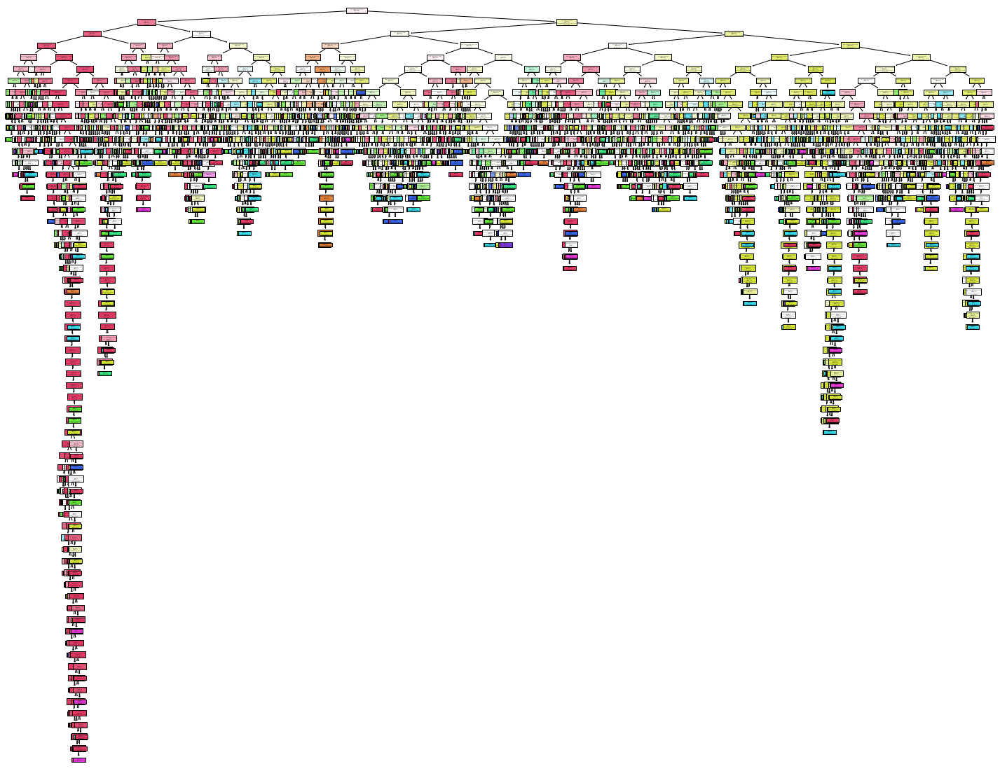

In [26]:
from sklearn import tree
fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(tree_full,
                   feature_names=feature_train_full.columns,
                   class_names=labelNames,
                   filled=True)

default tree is overfitting

In [31]:
# Train our decision tree with max depth = 5
tree_full_md5 = DecisionTreeClassifier(max_depth = 5, random_state=10)
tree_full_md5.fit(feature_train_full, label_train_full)

# Predict the labels for the test data
pred_labels_tree_full = tree_full_md5.predict(feature_test_full)


In [32]:
fig = plt.figure(figsize=(200,160))
_ = tree.plot_tree(tree_full_md5,
                   feature_names=feature_train_full.columns,
                   class_names=labelNames,
                   filled=True)

In [33]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(label_test_full, pred_labels_tree_full)

In [35]:
def plot_confusion_matrix(cm, names, title='DT - Confusion matrix', cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(names))
    plt.xticks(tick_marks, names, rotation=90)
    plt.yticks(tick_marks, names)
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

[[ 17  30  11   0   2   0   0   0   2]
 [  3 451  18   6  10   0   0   0  44]
 [  4  61  18   2   6   0   0   0  34]
 [  2  22   1   9   0   0   0   0  18]
 [  0  97   2   0  11   0   0   0  10]
 [ 11  29  10   1   0   0   0   0  23]
 [  0   1   0   0   0   0   0   0   1]
 [  0  13   1   0   0   0   0   0   5]
 [  3 111   6   4   6   0   0   0 481]]


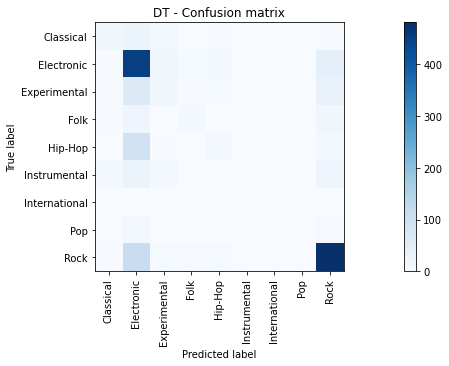

In [36]:
print(confusion_matrix)
plt.figure()
plot_confusion_matrix(confusion_matrix, labelNames)
plt.show()

In [37]:
from itertools import product

def plot_confusion_matrix(cm, names, title='FMA DT - Confusion matrix', cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(names))
    plt.xticks(tick_marks, names, rotation=90)
    plt.yticks(tick_marks, names)
    
    for i, j in product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
        horizontalalignment="center",
        color="white" if cm[i, j] > 500 else "black")
    
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

[[ 17  30  11   0   2   0   0   0   2]
 [  3 451  18   6  10   0   0   0  44]
 [  4  61  18   2   6   0   0   0  34]
 [  2  22   1   9   0   0   0   0  18]
 [  0  97   2   0  11   0   0   0  10]
 [ 11  29  10   1   0   0   0   0  23]
 [  0   1   0   0   0   0   0   0   1]
 [  0  13   1   0   0   0   0   0   5]
 [  3 111   6   4   6   0   0   0 481]]


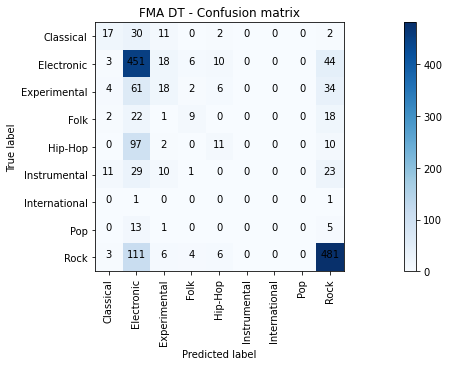

In [38]:
print(confusion_matrix)
plt.figure()
plot_confusion_matrix(confusion_matrix, labelNames)
plt.show()

In [43]:
import sklearn.metrics as metrics

print('md5 tree accuracy:', metrics.accuracy_score(label_test_full, pred_labels_tree_full))
print('md5 tree precision:', metrics.precision_score(label_test_full, pred_labels_tree_full, average='weighted'))
print('md5 tree recall:', metrics.recall_score(label_test_full, pred_labels_tree_full, average='weighted'))
print('md5 tree f1 score:', metrics.f1_score(label_test_full, pred_labels_tree_full, average='weighted'))

md5 tree accuracy: 0.6180338134001252
md5 tree precision: 0.5565848306193281
md5 tree recall: 0.6180338134001252
md5 tree f1 score: 0.5687488549236117


C:\Users\Daniel\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Random Oversampling

In [40]:
#!pip install imblearn

  Using cached imblearn-0.0-py2.py3-none-any.whl (1.9 kB)
  Using cached imbalanced_learn-0.8.0-py3-none-any.whl (206 kB)


In [41]:
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

In [44]:
oversampler = RandomOverSampler(random_state = 10)
oversample_feature_train, oversample_label_train = oversampler.fit_resample(feature_train_full, label_train_full)

In [45]:
# Train our decision tree with max depth = 5
tree_full_oversample = DecisionTreeClassifier(max_depth = 5, random_state=10)
tree_full_oversample.fit(oversample_feature_train, oversample_label_train)

# Predict the labels for the test data
pred_labels_tree_oversample = tree_full_oversample.predict(feature_test_full)

In [46]:
from sklearn import tree
fig = plt.figure(figsize=(200,160))
_ = tree.plot_tree(tree_full_oversample,
                   feature_names=feature_train_full.columns,
                   class_names=labelNames,
                   filled=True)

In [48]:
oversample_confusion_matrix = metrics.confusion_matrix(label_test_full,pred_labels_tree_oversample)

[[ 17  30  11   0   2   0   0   0   2]
 [  3 451  18   6  10   0   0   0  44]
 [  4  61  18   2   6   0   0   0  34]
 [  2  22   1   9   0   0   0   0  18]
 [  0  97   2   0  11   0   0   0  10]
 [ 11  29  10   1   0   0   0   0  23]
 [  0   1   0   0   0   0   0   0   1]
 [  0  13   1   0   0   0   0   0   5]
 [  3 111   6   4   6   0   0   0 481]]


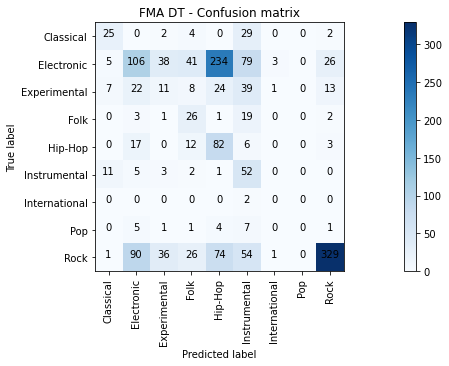

In [49]:
print(confusion_matrix)
plt.figure()
plot_confusion_matrix(oversample_confusion_matrix, labelNames)
plt.show()

In [50]:
print('oversample tree accuracy:', metrics.accuracy_score(label_test_full, pred_labels_tree_oversample))
print('oversample tree precision:', metrics.precision_score(label_test_full, pred_labels_tree_oversample, average='weighted'))
print('oversample tree recall:', metrics.recall_score(label_test_full, pred_labels_tree_oversample, average='weighted'))
print('oversample tree f1 score:', metrics.f1_score(label_test_full, pred_labels_tree_oversample, average='weighted'))

oversample tree accuracy: 0.39511584220413276
oversample tree precision: 0.5364391393924832
oversample tree recall: 0.39511584220413276
oversample tree f1 score: 0.41703999896670646


C:\Users\Daniel\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Random undersampling

In [51]:
undersampler = RandomUnderSampler(random_state = 10)
undersample_feature_train, undersample_label_train = undersampler.fit_resample(feature_train_full, label_train_full)

In [52]:
# Train our decision tree with max depth = 5
tree_full_undersample = DecisionTreeClassifier(max_depth = 5, random_state=10)
tree_full_undersample.fit(undersample_feature_train, undersample_label_train)

# Predict the labels for the test data
pred_labels_tree_undersample = tree_full_undersample.predict(feature_test_full)

In [53]:
from sklearn import tree
fig = plt.figure(figsize=(200,160))
_ = tree.plot_tree(tree_full_undersample,
                   feature_names=feature_train_full.columns,
                   class_names=labelNames,
                   filled=True)

[[ 17  30  11   0   2   0   0   0   2]
 [  3 451  18   6  10   0   0   0  44]
 [  4  61  18   2   6   0   0   0  34]
 [  2  22   1   9   0   0   0   0  18]
 [  0  97   2   0  11   0   0   0  10]
 [ 11  29  10   1   0   0   0   0  23]
 [  0   1   0   0   0   0   0   0   1]
 [  0  13   1   0   0   0   0   0   5]
 [  3 111   6   4   6   0   0   0 481]]


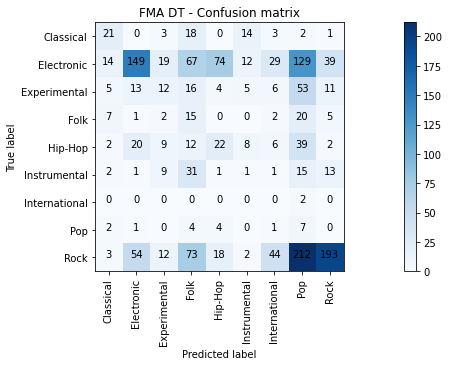

In [54]:
undersample_confusion_matrix = metrics.confusion_matrix(label_test_full,pred_labels_tree_undersample)

print(confusion_matrix)
plt.figure()
plot_confusion_matrix(undersample_confusion_matrix, labelNames)
plt.show()

In [55]:
print('undersample tree accuracy:', metrics.accuracy_score(label_test_full, pred_labels_tree_undersample))
print('undersample tree precision:', metrics.precision_score(label_test_full, pred_labels_tree_undersample, average='weighted'))
print('undersample tree recall:', metrics.recall_score(label_test_full, pred_labels_tree_undersample, average='weighted'))
print('undersample tree f1 score:', metrics.f1_score(label_test_full, pred_labels_tree_undersample, average='weighted'))

undersample tree accuracy: 0.2629931120851597
undersample tree precision: 0.5329546906287108
undersample tree recall: 0.2629931120851597
undersample tree f1 score: 0.3393186061746834


## Undersample to match other genre to size of Classical genre

In [57]:
# Subset only the hip-hop tracks, and then only the rock tracks
hop_only = df_features.loc[df_features['genre_top'] == 'Hip-Hop']
rock_only = df_features.loc[df_features['genre_top']== 'Rock']
classical_only = df_features.loc[df_features['genre_top']== 'Classical']
electronic_only = df_features.loc[df_features['genre_top']== 'Electronic']
experimental_only = df_features.loc[df_features['genre_top']== 'Experimental']
folk_only = df_features.loc[df_features['genre_top']== 'Folk']
instrumental_only = df_features.loc[df_features['genre_top']== 'Instrumental']
international_only = df_features.loc[df_features['genre_top']== 'International']
pop_only = df_features.loc[df_features['genre_top']== 'Pop']

print(hop_only.shape)
print(rock_only.shape) 
print(classical_only.shape) 
print(electronic_only.shape) 
print(experimental_only.shape)
print(folk_only.shape)
print(instrumental_only.shape) 
print(international_only.shape) 
print(pop_only.shape) 

(3552, 521)
(14182, 521)
(1230, 521)
(9372, 521)
(10608, 521)
(2803, 521)
(2079, 521)
(1389, 521)
(2332, 521)


In [75]:
# sample non-classical songs to be the same number as there are classical songs
rock_only = rock_only.sample(classical_only.shape[0], random_state=10)
hop_only = hop_only.sample(classical_only.shape[0], random_state=10)
electronic_only = electronic_only.sample(classical_only.shape[0], random_state=10)
experimental_only = experimental_only.sample(classical_only.shape[0], random_state=10)
folk_only = folk_only.sample(classical_only.shape[0], random_state=10)
instrumental_only = instrumental_only.sample(classical_only.shape[0], random_state=10)
international_only = international_only.sample(classical_only.shape[0], random_state=10)
pop_only = pop_only.sample(classical_only.shape[0], random_state=10)

# concatenate the dataframes rock_only and hop_only
all_bal = pd.concat([classical_only,rock_only,hop_only,electronic_only,experimental_only,folk_only,instrumental_only,international_only,pop_only])

,"(chroma_cens, kurtosis, 01)","(chroma_cens, kurtosis, 02)","(chroma_cens, kurtosis, 03)","(chroma_cens, kurtosis, 04)","(chroma_cens, kurtosis, 05)","(chroma_cens, kurtosis, 06)","(chroma_cens, kurtosis, 07)","(chroma_cens, kurtosis, 08)","(chroma_cens, kurtosis, 09)","(chroma_cens, kurtosis, 10)",...,"(zcr, kurtosis, 01)","(zcr, max, 01)","(zcr, mean, 01)","(zcr, median, 01)","(zcr, min, 01)","(zcr, skew, 01)","(zcr, std, 01)",genre_top,split,subset
track_id,,,,,,,,,,,,,,,,,,,,,
64079,0.171237,-0.707097,1.573068,0.069963,0.118230,0.123442,-0.595407,-0.098357,-0.574639,-0.601153,...,1.541551,0.193359,0.043750,0.042480,0.000000,0.548821,0.015279,Pop,validation,small
46930,-0.742691,0.567404,-1.259704,-0.213606,-1.283068,0.674195,-0.941077,-1.265932,-0.731320,-0.784082,...,20.825134,0.385742,0.052148,0.047363,0.003418,3.327288,0.039137,Pop,training,small
26174,0.043796,-0.609555,-0.825969,-0.497058,-0.484644,0.270037,-0.278983,-0.740395,-0.572864,0.619229,...,179.424759,0.802734,0.039099,0.033691,0.000000,9.044255,0.029014,Pop,training,small
46929,0.451757,1.219185,0.861154,-0.386462,3.447211,1.044363,1.522023,1.548593,4.498136,0.738702,...,3.539799,0.500488,0.055008,0.046387,0.001953,1.111890,0.038024,Pop,training,large
36559,2.234654,-0.454723,0.400760,0.470869,2.692631,1.813000,0.361178,-0.074390,0.257866,0.366403,...,23.077490,0.659180,0.057392,0.037598,0.002930,3.855434,0.066737,Pop,validation,large
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
111373,0.520785,-0.115512,0.368141,0.139716,0.040329,-0.149774,-0.292414,-0.481902,-0.162103,-0.141636,...,33.468174,0.349121,0.030635,0.024902,0.001953,4.679694,0.027265,Pop,training,large
42907,-0.328869,-0.479007,-0.290590,-0.724813,2.175321,-0.541768,0.193737,-0.894796,-0.846873,1.108040,...,3.876090,0.269531,0.058802,0.045410,0.002441,1.707875,0.039771,Pop,validation,medium
29423,0.051458,-0.277778,0.059201,0.301536,0.565191,-0.113981,2.060316,0.424626,1.683405,0.434320,...,4.865487,0.233398,0.079554,0.073730,0.000000,1.875576,0.036858,Pop,training,large


In [71]:
# Drop track id column in full2 dataset
features_full2 = all_bal.reset_index(drop=True)

# Splitting data into train, valid and test
train_full2 = all_bal.index[all_bal['split'] == 'training']
val_full2 = all_bal.index[all_bal['split'] == 'validation']
test_full2 = all_bal.index[all_bal['split'] == 'test']

# Define our features
feature_train_full2 = all_bal.loc[train_full2]
feature_val_full2 = all_bal.loc[val_full2]
feature_test_full2 = all_bal.loc[test_full2]
feature_train_full2 = feature_train_full2.drop(columns=['genre_top','split','subset'])
feature_val_full2 = feature_val_full2.drop(columns=['genre_top','split','subset'])
feature_test_full2 = feature_test_full2.drop(columns=['genre_top','split','subset'])
#features = df_medium.drop(columns=['genre_top','split','subset'])

# Define our labels
label_train_full2 = all_bal['genre_top'][train_full2]
label_val_full2 = all_bal['genre_top'][val_full2]
label_test_full2 = all_bal['genre_top'][test_full2]
#labels = df_medium['genre_top']

# Import the StandardScaler
from sklearn.preprocessing import StandardScaler

# Scale the features and set the values to a new variable
#scaler = StandardScaler()
#scaled_train_features2 = scaler.fit_transform(feature_train_full2)

In [72]:
# Train our decision tree with max depth = 5
tree_full_allbal = DecisionTreeClassifier(max_depth = 5, random_state=10)
tree_full_allbal.fit(feature_train_full2, label_train_full2)

# Predict the labels for the test data
pred_labels_tree_allbal = tree_full_allbal.predict(feature_test_full2)

In [73]:
from sklearn import tree
fig = plt.figure(figsize=(200,160))
_ = tree.plot_tree(tree_full_allbal,
                   feature_names=feature_train_full.columns,
                   class_names=labelNames,
                   filled=True)

[[ 17  30  11   0   2   0   0   0   2]
 [  3 451  18   6  10   0   0   0  44]
 [  4  61  18   2   6   0   0   0  34]
 [  2  22   1   9   0   0   0   0  18]
 [  0  97   2   0  11   0   0   0  10]
 [ 11  29  10   1   0   0   0   0  23]
 [  0   1   0   0   0   0   0   0   1]
 [  0  13   1   0   0   0   0   0   5]
 [  3 111   6   4   6   0   0   0 481]]


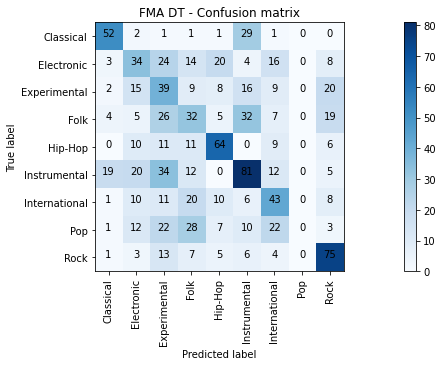

In [74]:
allbal_confusion_matrix = metrics.confusion_matrix(label_test_full2,pred_labels_tree_allbal)

print(confusion_matrix)
plt.figure()
plot_confusion_matrix(allbal_confusion_matrix, labelNames)
plt.show()

In [98]:
print('undersample tree accuracy:', metrics.accuracy_score(label_test_full2, pred_labels_tree_allbal))
print('undersample tree precision:', metrics.precision_score(label_test_full2, pred_labels_tree_allbal, average='micro'))
print('undersample tree recall:', metrics.recall_score(label_test_full2, pred_labels_tree_allbal, average='micro'))
print('undersample tree f1 score:', metrics.f1_score(label_test_full2, pred_labels_tree_allbal, average='micro'))

undersample tree accuracy: 0.3888888888888889
undersample tree precision: 0.3888888888888889
undersample tree recall: 0.3888888888888889
undersample tree f1 score: 0.3888888888888889


#### Sampling conclusion
balance all genres to classical shape decreased precision, and improve the accuracy, f1, and recall.

## PCA

Text(0.5, 0, 'Principal Component #')

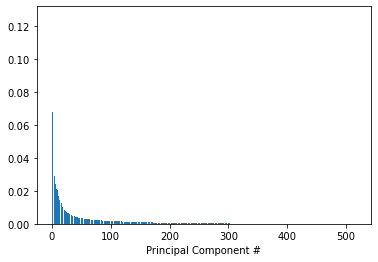

In [77]:
# This is just to make plots appear in the notebook
%matplotlib inline

# Import our plotting module, and PCA class
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Get our explained variance ratios from PCA using all features
pca = PCA()
pca.fit(scaled_train_features2)
exp_variance = pca.explained_variance_ratio_

# plot the explained variance using a barplot
fig, ax = plt.subplots()
ax.bar(range(pca.n_components_), exp_variance)
ax.set_xlabel('Principal Component #')

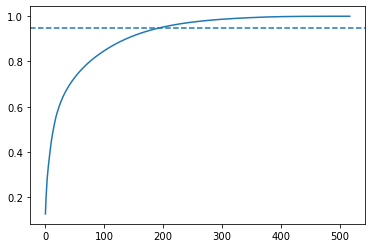

In [79]:
# Calculate the cumulative explained variance
cum_exp_variance = np.cumsum(exp_variance)

# Plot the cumulative explained variance and draw a dashed line at 0.85.
fig, ax = plt.subplots()
ax.plot(cum_exp_variance)
ax.axhline(y=0.95, linestyle='--')

# choose the n_components where about 85% of our variance can be explained
n_components = 216

# Perform PCA with the chosen number of components and project data onto components
pca = PCA(n_components, random_state=10)
pca.fit(scaled_train_features)
pca_projection = pca.transform(scaled_train_features2)

In [90]:
# Scale the features and set the values to a new variable
scaler = StandardScaler()
scaled_train_features2 = scaler.fit_transform(feature_train_full2)
scaled_test_features2 = scaler.fit_transform(feature_test_full2)

In [91]:
pca = PCA(n_components = 0.95)
pca.fit(scaled_train_features2)
reduced_train_features = pca.transform(scaled_train_features2)
reduced_test_features = pca.transform(scaled_test_features2)

In [92]:
# Train our decision tree with max depth = 5
tree_pca = DecisionTreeClassifier(max_depth = 5, random_state=10)
tree_pca.fit(reduced_train_features, label_train_full2)

# Predict the labels for the test data
pred_labels_tree_pca = tree_pca.predict(reduced_test_features)

In [93]:
from sklearn import tree
fig = plt.figure(figsize=(200,160))
_ = tree.plot_tree(tree_pca,
                   feature_names=feature_train_full2.columns,
                   class_names=labelNames,
                   filled=True)

[[ 17  30  11   0   2   0   0   0   2]
 [  3 451  18   6  10   0   0   0  44]
 [  4  61  18   2   6   0   0   0  34]
 [  2  22   1   9   0   0   0   0  18]
 [  0  97   2   0  11   0   0   0  10]
 [ 11  29  10   1   0   0   0   0  23]
 [  0   1   0   0   0   0   0   0   1]
 [  0  13   1   0   0   0   0   0   5]
 [  3 111   6   4   6   0   0   0 481]]


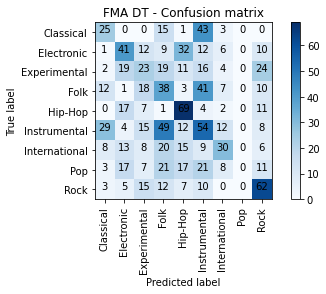

In [94]:
pca_confusion_matrix = metrics.confusion_matrix(label_test_full2,pred_labels_tree_pca)

print(confusion_matrix)
plt.figure()
plot_confusion_matrix(pca_confusion_matrix, labelNames)
plt.show()

In [99]:
print('pca allbal tree accuracy:', metrics.accuracy_score(label_test_full2, pred_labels_tree_pca))
print('pca allbal tree precision:', metrics.precision_score(label_test_full2, pred_labels_tree_pca, average='micro'))
print('pca allbal tree recall:', metrics.recall_score(label_test_full2, pred_labels_tree_pca, average='micro'))
print('pca allbal tree f1 score:', metrics.f1_score(label_test_full2, pred_labels_tree_pca, average='micro'))

pca allbal tree accuracy: 0.31666666666666665
pca allbal tree precision: 0.31666666666666665
pca allbal tree recall: 0.31666666666666665
pca allbal tree f1 score: 0.31666666666666665


## Hyper-parameter tuning

In [100]:
from sklearn.model_selection import GridSearchCV

In [101]:
dt = DecisionTreeClassifier(random_state=10)

In [102]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [2, 3, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion': ["gini", "entropy"]
}

In [103]:
# Instantiate the grid search model
grid_search = GridSearchCV(estimator=dt, 
                           param_grid=params, 
                           cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

In [105]:
# grid search on full unsampled data
grid_search.fit(feature_train_full, label_train_full)

Fitting 4 folds for each of 50 candidates, totalling 200 fits


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=10), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100]},
             scoring='accuracy', verbose=1)

In [106]:
score_df = pd.DataFrame(grid_search.cv_results_)
score_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,1.730026,0.053896,0.022999,0.003936,gini,2,5,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.547711,0.571244,0.580593,0.565624,0.566293,0.011987,45
1,1.731025,0.058538,0.028501,0.007159,gini,2,10,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.547711,0.571244,0.580593,0.565624,0.566293,0.011987,45
2,1.694274,0.039878,0.024252,0.004550,gini,2,20,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.547711,0.571244,0.580593,0.565624,0.566293,0.011987,45
3,1.549006,0.026312,0.017250,0.000433,gini,2,50,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.547711,0.571244,0.580593,0.565624,0.566293,0.011987,45
4,1.536505,0.017804,0.018251,0.000432,gini,2,100,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.547711,0.571244,0.580593,0.565624,0.566293,0.011987,45


In [107]:
score_df.nlargest(5,"mean_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
44,18.529735,0.504110,0.021000,0.001000,entropy,10,100,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.613153,0.619923,0.653127,0.627862,0.628516,0.015133,1
49,13.907675,0.298851,0.010246,0.001281,entropy,20,100,"{'criterion': 'entropy', 'max_depth': 20, 'min...",0.613153,0.619923,0.653127,0.627862,0.628516,0.015133,1
43,20.255962,0.379716,0.021501,0.000866,entropy,10,50,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.608962,0.608962,0.663121,0.629474,0.627630,0.022136,3
48,19.654607,0.270295,0.013499,0.001499,entropy,20,50,"{'criterion': 'entropy', 'max_depth': 20, 'min...",0.608962,0.608962,0.663121,0.629474,0.627630,0.022136,3
19,4.892497,0.063065,0.018000,0.001225,gini,10,100,"{'criterion': 'gini', 'max_depth': 10, 'min_sa...",0.608962,0.616054,0.633462,0.633989,0.623117,0.010903,5


In [108]:
grid_search.best_estimator_

DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=100,
                       random_state=10)

In [111]:
# Instantiate the grid search model
grid_search2 = GridSearchCV(estimator=dt, 
                           param_grid=params, 
                           cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

In [112]:
# grid search on undersampled data
grid_search2.fit(feature_train_full2, label_train_full2)

Fitting 4 folds for each of 50 candidates, totalling 200 fits


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=10), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100]},
             scoring='accuracy', verbose=1)

In [113]:
score_df2 = pd.DataFrame(grid_search2.cv_results_)
score_df2.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,1.120246,0.008409,0.016000,9.291445e-07,gini,2,5,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.221776,0.246319,0.274431,0.236607,0.244783,0.019219,46
1,1.114747,0.015514,0.017750,1.784886e-03,gini,2,10,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.221776,0.246319,0.274431,0.236607,0.244783,0.019219,46
2,1.122000,0.018934,0.018501,1.658246e-03,gini,2,20,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.221776,0.246319,0.274431,0.236607,0.244783,0.019219,46
3,1.118024,0.010560,0.015001,1.733130e-03,gini,2,50,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.221776,0.246319,0.274431,0.236607,0.244783,0.019219,46
4,1.129023,0.013945,0.015250,4.334987e-04,gini,2,100,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.221776,0.246319,0.274431,0.236607,0.244783,0.019219,46


In [114]:
score_df2.nlargest(5,"mean_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
18,3.392802,0.043043,0.014750,4.330502e-04,gini,10,50,"{'criterion': 'gini', 'max_depth': 10, 'min_sa...",0.390451,0.432842,0.431950,0.396429,0.412918,0.019595,1
23,3.543264,0.097120,0.014750,8.288448e-04,gini,20,50,"{'criterion': 'gini', 'max_depth': 20, 'min_sa...",0.390451,0.432842,0.431950,0.396429,0.412918,0.019595,1
44,10.055827,0.160655,0.014000,9.386549e-07,entropy,10,100,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.396698,0.423472,0.441321,0.361161,0.405663,0.030205,3
49,7.627654,0.143947,0.007761,4.382155e-04,entropy,20,100,"{'criterion': 'entropy', 'max_depth': 20, 'min...",0.396698,0.423472,0.441321,0.361161,0.405663,0.030205,3
17,4.031992,0.048859,0.015751,1.298703e-03,gini,10,20,"{'criterion': 'gini', 'max_depth': 10, 'min_sa...",0.395359,0.417224,0.433735,0.373214,0.404883,0.022794,5


In [115]:
grid_search2.best_estimator_

DecisionTreeClassifier(max_depth=10, min_samples_leaf=50, random_state=10)

In [137]:
# Instantiate the grid search model
grid_search3 = GridSearchCV(estimator=dt, 
                           param_grid=params, 
                           cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

In [138]:
# grid search on PCA
grid_search3.fit(reduced_train_features, label_train_full2)

Fitting 4 folds for each of 50 candidates, totalling 200 fits


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=10), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100]},
             scoring='accuracy', verbose=1)

In [139]:
score_df3 = pd.DataFrame(grid_search2.cv_results_)
score_df3.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,1.120246,0.008409,0.016000,9.291445e-07,gini,2,5,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.221776,0.246319,0.274431,0.236607,0.244783,0.019219,46
1,1.114747,0.015514,0.017750,1.784886e-03,gini,2,10,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.221776,0.246319,0.274431,0.236607,0.244783,0.019219,46
2,1.122000,0.018934,0.018501,1.658246e-03,gini,2,20,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.221776,0.246319,0.274431,0.236607,0.244783,0.019219,46
3,1.118024,0.010560,0.015001,1.733130e-03,gini,2,50,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.221776,0.246319,0.274431,0.236607,0.244783,0.019219,46
4,1.129023,0.013945,0.015250,4.334987e-04,gini,2,100,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.221776,0.246319,0.274431,0.236607,0.244783,0.019219,46


In [140]:
score_df3.nlargest(5,"mean_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
18,3.392802,0.043043,0.014750,4.330502e-04,gini,10,50,"{'criterion': 'gini', 'max_depth': 10, 'min_sa...",0.390451,0.432842,0.431950,0.396429,0.412918,0.019595,1
23,3.543264,0.097120,0.014750,8.288448e-04,gini,20,50,"{'criterion': 'gini', 'max_depth': 20, 'min_sa...",0.390451,0.432842,0.431950,0.396429,0.412918,0.019595,1
44,10.055827,0.160655,0.014000,9.386549e-07,entropy,10,100,"{'criterion': 'entropy', 'max_depth': 10, 'min...",0.396698,0.423472,0.441321,0.361161,0.405663,0.030205,3
49,7.627654,0.143947,0.007761,4.382155e-04,entropy,20,100,"{'criterion': 'entropy', 'max_depth': 20, 'min...",0.396698,0.423472,0.441321,0.361161,0.405663,0.030205,3
17,4.031992,0.048859,0.015751,1.298703e-03,gini,10,20,"{'criterion': 'gini', 'max_depth': 10, 'min_sa...",0.395359,0.417224,0.433735,0.373214,0.404883,0.022794,5


In [141]:
grid_search3.best_estimator_

DecisionTreeClassifier(max_depth=20, min_samples_leaf=50, random_state=10)

## Rerunnning DT model on unsampled data with best estimator

In [116]:
# Train our decision tree with best estimator
tree_full_best = DecisionTreeClassifier(criterion='entropy', max_depth=10, min_samples_leaf=100, random_state=10)
tree_full_best.fit(feature_train_full, label_train_full)

# Predict the labels for the test data
pred_labels_tree_fullbest = tree_full_best.predict(feature_test_full)

In [117]:
from sklearn import tree
fig = plt.figure(figsize=(200,160))
_ = tree.plot_tree(tree_full_best,
                   feature_names=feature_train_full.columns,
                   class_names=labelNames,
                   filled=True)

[[ 17  30  11   0   2   0   0   0   2]
 [  3 451  18   6  10   0   0   0  44]
 [  4  61  18   2   6   0   0   0  34]
 [  2  22   1   9   0   0   0   0  18]
 [  0  97   2   0  11   0   0   0  10]
 [ 11  29  10   1   0   0   0   0  23]
 [  0   1   0   0   0   0   0   0   1]
 [  0  13   1   0   0   0   0   0   5]
 [  3 111   6   4   6   0   0   0 481]]


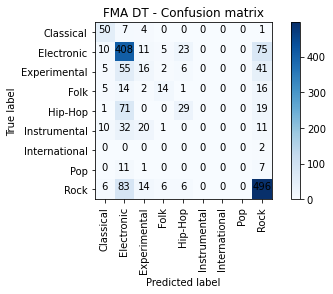

In [118]:
fullbest_confusion_matrix = metrics.confusion_matrix(label_test_full,pred_labels_tree_fullbest)

print(confusion_matrix)
plt.figure()
plot_confusion_matrix(fullbest_confusion_matrix, labelNames)
plt.show()

In [119]:
print('fullbest tree accuracy:', metrics.accuracy_score(label_test_full, pred_labels_tree_fullbest))
print('fullbest tree precision:', metrics.precision_score(label_test_full, pred_labels_tree_fullbest, average='weighted'))
print('fullbest tree recall:', metrics.recall_score(label_test_full, pred_labels_tree_fullbest, average='weighted'))
print('fullbest tree f1 score:', metrics.f1_score(label_test_full, pred_labels_tree_fullbest, average='weighted'))

fullbest tree accuracy: 0.6343143393863494
fullbest tree precision: 0.5741955756994467
fullbest tree recall: 0.6343143393863494
fullbest tree f1 score: 0.5948252435809978


C:\Users\Daniel\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Rerunnning DT model on balanced data with best estimator

In [120]:
# Train our decision tree with best estimator
tree_bal_best = DecisionTreeClassifier(max_depth=10, min_samples_leaf=50, random_state=10)
tree_bal_best.fit(feature_train_full2, label_train_full2)

# Predict the labels for the test data
pred_labels_tree_balbest = tree_bal_best.predict(feature_test_full2)

In [121]:
from sklearn import tree
fig = plt.figure(figsize=(200,160))
_ = tree.plot_tree(tree_bal_best,
                   feature_names=feature_train_full2.columns,
                   class_names=labelNames,
                   filled=True)

[[ 17  30  11   0   2   0   0   0   2]
 [  3 451  18   6  10   0   0   0  44]
 [  4  61  18   2   6   0   0   0  34]
 [  2  22   1   9   0   0   0   0  18]
 [  0  97   2   0  11   0   0   0  10]
 [ 11  29  10   1   0   0   0   0  23]
 [  0   1   0   0   0   0   0   0   1]
 [  0  13   1   0   0   0   0   0   5]
 [  3 111   6   4   6   0   0   0 481]]


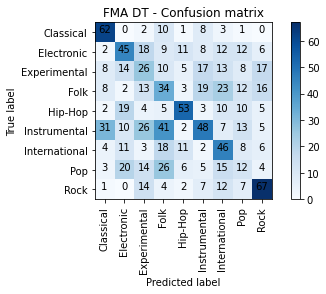

In [122]:
balbest_confusion_matrix = metrics.confusion_matrix(label_test_full2,pred_labels_tree_balbest)

print(confusion_matrix)
plt.figure()
plot_confusion_matrix(balbest_confusion_matrix, labelNames)
plt.show()

In [125]:
print('balbest tree accuracy:', metrics.accuracy_score(label_test_full2, pred_labels_tree_balbest))
print('balbest tree precision:', metrics.precision_score(label_test_full2, pred_labels_tree_balbest, average='micro'))
print('balbest tree recall:', metrics.recall_score(label_test_full2, pred_labels_tree_balbest, average='micro'))
print('balbest tree f1 score:', metrics.f1_score(label_test_full2, pred_labels_tree_balbest, average='micro'))

balbest tree accuracy: 0.3638888888888889
balbest tree precision: 0.3638888888888889
balbest tree recall: 0.3638888888888889
balbest tree f1 score: 0.3638888888888888


In [127]:
#Classification Report
from sklearn.metrics import classification_report

print("Decision Tree fullbest: \n", classification_report(label_test_full, pred_labels_tree_fullbest))
print("Decision Tree balbest: \n", classification_report(label_test_full2, pred_labels_tree_balbest))

Decision Tree fullbest: 
                precision    recall  f1-score   support

    Classical       0.57      0.81      0.67        62
   Electronic       0.60      0.77      0.67       532
 Experimental       0.24      0.13      0.17       125
         Folk       0.50      0.27      0.35        52
      Hip-Hop       0.45      0.24      0.31       120
 Instrumental       0.00      0.00      0.00        74
International       0.00      0.00      0.00         2
          Pop       0.00      0.00      0.00        19
         Rock       0.74      0.81      0.78       611

     accuracy                           0.63      1597
    macro avg       0.34      0.34      0.33      1597
 weighted avg       0.57      0.63      0.59      1597

Decision Tree balbest: 
                precision    recall  f1-score   support

    Classical       0.51      0.71      0.60        87
   Electronic       0.37      0.37      0.37       123
 Experimental       0.22      0.22      0.22       118
         F

C:\Users\Daniel\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Daniel\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Daniel\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## ROC Curve

In [142]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

In [143]:
ovr_tree = OneVsRestClassifier(DecisionTreeClassifier(max_depth=20, min_samples_leaf=50, random_state=10))

ovr_tree.fit(reduced_train_features, label_train_full2)

label_pred_ovr_tree = ovr_tree.predict(reduced_test_features)
label_pred_ovr_tree_probability = ovr_tree.predict_proba(reduced_test_features)

In [144]:
fpr = {}
tpr = {}
thresh ={}

n_class = 9

for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(label_test_full2, label_pred_ovr_tree_probability[:,i], pos_label=labelNames[i])

In [145]:
print(labelNames)

['Classical', 'Electronic', 'Experimental', 'Folk', 'Hip-Hop', 'Instrumental', 'International', 'Pop', 'Rock']


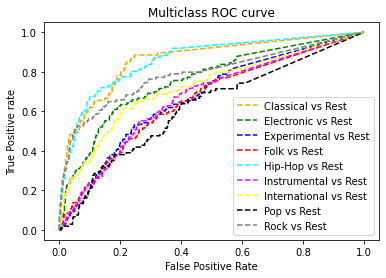

In [146]:
plt.plot(fpr[0], tpr[0], linestyle='--',color='orange', label='Classical vs Rest')
plt.plot(fpr[1], tpr[1], linestyle='--',color='green', label='Electronic vs Rest')
plt.plot(fpr[2], tpr[2], linestyle='--',color='blue', label='Experimental vs Rest')
plt.plot(fpr[3], tpr[3], linestyle='--',color='red', label='Folk vs Rest')
plt.plot(fpr[4], tpr[4], linestyle='--',color='cyan', label='Hip-Hop vs Rest')
plt.plot(fpr[5], tpr[5], linestyle='--',color='magenta', label='Instrumental vs Rest')
plt.plot(fpr[6], tpr[6], linestyle='--',color='yellow', label='International vs Rest')
plt.plot(fpr[7], tpr[7], linestyle='--',color='black', label='Pop vs Rest')
plt.plot(fpr[8], tpr[8], linestyle='--',color='grey', label='Rock vs Rest')
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.savefig('Multiclass ROC',dpi=300);

In [147]:
auc_score = roc_auc_score(label_test_full2, label_pred_ovr_tree_probability, multi_class = 'ovr')
print(auc_score)

0.7336566404145336


In [150]:
from graphviz import Source
from sklearn.tree import export_graphviz

export_graphviz(
        tree_bal_best,
        out_file="balbest_tree.dot",
        feature_names=feature_train_full2.columns,
        class_names=labelNames,
        rounded=True,
        filled=True
    )

!dot -Tpng balbest_tree.dot -o balbest_tree.png